(600, 733, 3)
(600, 733)
(600, 733)
Found bbox (258, 187, 289, 233) 1
Found bbox (275, 172, 356, 304) 2


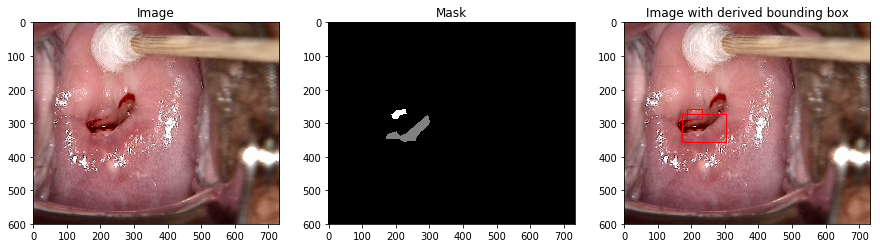

In [8]:
from skimage.measure import label, regionprops
import os
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

mask_root = '/data/mxj/Cervix/Segmentation/cervix_resize_600_segmentation/Masks'
img_root = '/data/mxj/Cervix/Segmentation/cervix_resize_600_segmentation/Images'

for name in os.listdir(mask_root):
    name = name.split('.')[0]
    mask = np.array(Image.open(os.path.join(mask_root, name + '.gif')))
    img = cv2.imread(os.path.join(img_root, name + '.jpg'))[:,:,[2,1,0]]
    print(img.shape)
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (15, 5))
    print(mask.shape)
    print(img.shape[:2])
    
    lbl = label(mask)
    props = regionprops(lbl)
    img_1 = img.copy()
    for prop in props:
        print('Found bbox', prop.bbox, prop.label)
        cv2.rectangle(img_1, (prop.bbox[1], prop.bbox[0]), (prop.bbox[3], prop.bbox[2]), (255, 0, 0), 2)
        
    ax1.imshow(img)
    ax1.set_title('Image')
    ax2.set_title('Mask')
    ax3.set_title('Image with derived bounding box')
    ax2.imshow(mask, cmap='gray')
    ax3.imshow(img_1)
    plt.show()
    
    break
    

(600, 733)


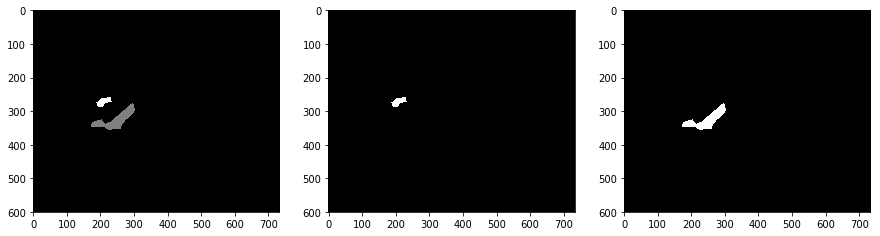

In [40]:
from skimage.measure import label, regionprops
import os
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm_notebook as tqdm
import pickle as pkl


mask_root = '/data/mxj/Cervix/Segmentation/cervix_resize_600_segmentation/Masks'
img_root = '/data/mxj/Cervix/Segmentation/cervix_resize_600_segmentation/Images'
save_path = '/data/lxc/Cervix/detection/boxes.txt'

for mask_name in os.listdir(mask_root):
    name = mask_name.split('.')[0]
    mask_path = os.path.join(mask_root, maks_name)
    mask = np.array(Image.open(mask_path))
    shape = mask.shape
    
    lbl = label(mask)
    props = regionprops(lbl)
    annos = []
    
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (15, 5))
    ax1.imshow(mask, cmap='gray')
    for prop, ax in zip(props, (ax2, ax3)):
        box = [prop.bbox[1], prop.bbox[0], prop.bbox[3], prop.bbox[2]]
        # (N, 2) ndarray, Coordinate list (row, col) of the region. conver to (2, N)
        coords = prop.coords.T
        segm = np.zeros(shape).astype(np.uint8)
        segm[coords[0], coords[1]] = mask[coords[0], coords[1]] 

        label = segm.max()
        segm[segm!=0] = 1
        
        ax.imshow(segm, cmap='gray')

    plt.show()
        

    break

In [2]:
from skimage.measure import label, regionprops
import os
import cv2
from PIL import Image
import numpy as np
from tqdm import tqdm_notebook as tqdm
import pickle as pkl
import pycocotools.mask as mask_utils

mask_root = '/data/mxj/Cervix/Segmentation/cervix_resize_600_segmentation/Masks'

info = {}
for mask_name in tqdm(os.listdir(mask_root)):
    name = mask_name.split('.')[0]
    mask_path = os.path.join(mask_root, mask_name)
    mask = np.array(Image.open(mask_path))
    shape = mask.shape
    
    lbl = label(mask)
    props = regionprops(lbl)
    annos = []
    
    for prop in props:
        box = [prop.bbox[1], prop.bbox[0], prop.bbox[3], prop.bbox[2]]
        # (N, 2) ndarray, Coordinate list (row, col) of the region. conver to (2, N)
        coords = prop.coords.T
        segm = np.zeros(shape).astype(np.uint8)
        segm[coords[0], coords[1]] = mask[coords[0], coords[1]] 

        segm_label = segm.max()
        segm[segm!=0] = 1
        segm = np.array(segm, order="F").astype(np.uint8)
        segm = mask_utils.encode(segm)
        
        annos.append({
            'box': box,
            'segmentation': segm,
            'label': int(segm_label)
        })
    
    info[name] = {
        'shape': shape,
        'annos': annos
    }

pkl.dump(info, open('/data/lxc/Cervix/detection/annos/anno.pkl', 'wb'))

True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True


KeyboardInterrupt: 

In [17]:
import pickle as pkl
info = pkl.load(open('/data/lxc/Cervix/detection/annos/anno.pkl', 'rb'))
for i, (k, v) in enumerate(info.items()):
    print(k, ":", v)
    if i>3:
        break

05751647_2016-01-08_2 : {'shape': (600, 733), 'annos': [{'box': [187, 258, 233, 289], 'segmentation': {'size': [600, 733], 'counts': b'ij]32fb0003L4M3L4M2L200O1O001O1O1O1O1000O10O100000O1N2N2N2N20O010000O1000O010000O10O10O10003M4K5LcfT9'}, 'label': 2}, {'box': [172, 275, 304, 356], 'segmentation': {'size': [600, 733], 'counts': b'hSU33ab04L4M300O1000000O10000N200000000O100000000O1000000O1000001N1001O1O2N2OO01O2N1O1O2N11M100O101N101N101N101O0O2O0000O0100O1N101O1O1O010O1O1O1O1O1O1O2N1O10000O1O1O1O1O1N2O1O1O1O1OO1M3O1N2O2N1010O01N10000O1O101N1001N101O000010O01O00010O00O2O0000001M20003M4L4L4K7J4L4L`Rk7'}, 'label': 1}]}
02832708_2013-10-28_2 : {'shape': (600, 900), 'annos': []}
15918078_2017-06-30_2 : {'shape': (600, 733), 'annos': []}
15901928_2015-07-29_3 : {'shape': (600, 900), 'annos': [{'box': [335, 22, 461, 138], 'segmentation': {'size': [600, 900], 'counts': b'P\\T62cb04L4L3N3O1O1N101O1O1N2O001O1N2O0O2N2N2N1O2N1O2N1O2O1N1O2N1O2N1jN_NTAc1k>`NQAa1o>aNn@a1R?aNj@a1U?bNe@a1[?aN^@e1a?^NX@f

In [15]:
import pickle as pkl
from tqdm import tqdm_notebook as tqdm
info = pkl.load(open('/data/lxc/Cervix/detection/annos/anno.pkl', 'rb'))

labels = [0, 1, 2, 3]

print(info['16801254_2017-05-25_2'])

{'shape': (600, 733), 'annos': [{'box': [392, 268, 444, 311], 'segmentation': {'size': [600, 733], 'counts': b'doU73bb03N2M3M102N2N2M3O1N101N2N110O0010O00001O01O01O000010O0O11O010O1O2N10000O1N2O3N0O1O101N1O1O2O1N2N2N2O1NSRY5'}, 'label': 3}, {'box': [371, 329, 425, 364], 'segmentation': {'size': [600, 733], 'counts': b'^gi66\\b06O1N200O1O1O1O100O1O1O100O10000O1O10O00001O001O0O2O001O1O1O0O2O10O0100O1O010O1O10N11O1O3N0O1O101N1O1O2O0OdTd5'}, 'label': 3}, {'box': [253, 334, 333, 399], 'segmentation': {'size': [600, 733], 'counts': b'abd43eb05K4L4L4L2N2N3M2N1O101N1O2N001O1O2N1O1O001O1N3N0O2N2O0O2N2O0O2N2O1O0O1O2O0O1O100O10O2O001O001O001O001O001O000O2O001O001O2M2O1N3M3N1N3M2N2O2L4M3N2M102L4L5K4L4L[PZ7'}, 'label': 2}, {'box': [362, 367, 434, 431], 'segmentation': {'size': [600, 733], 'counts': b'Q`d65[b0:H9L3N2N0O3N2M2N2O0O2O0O2N2O0O2N2O0O2O0O2N2O000O3N0O10000000000000000000000000N1nNS_O;m`0EV_O7k`0HZ_O4f`0LZ_O4f`0L]_O0c`00`_ON``02a_OL``03c_OK]`05d_OI[`07h_OHX`08i_OFX`09j_OFV`0:k_ODU`0<m_OCS`0

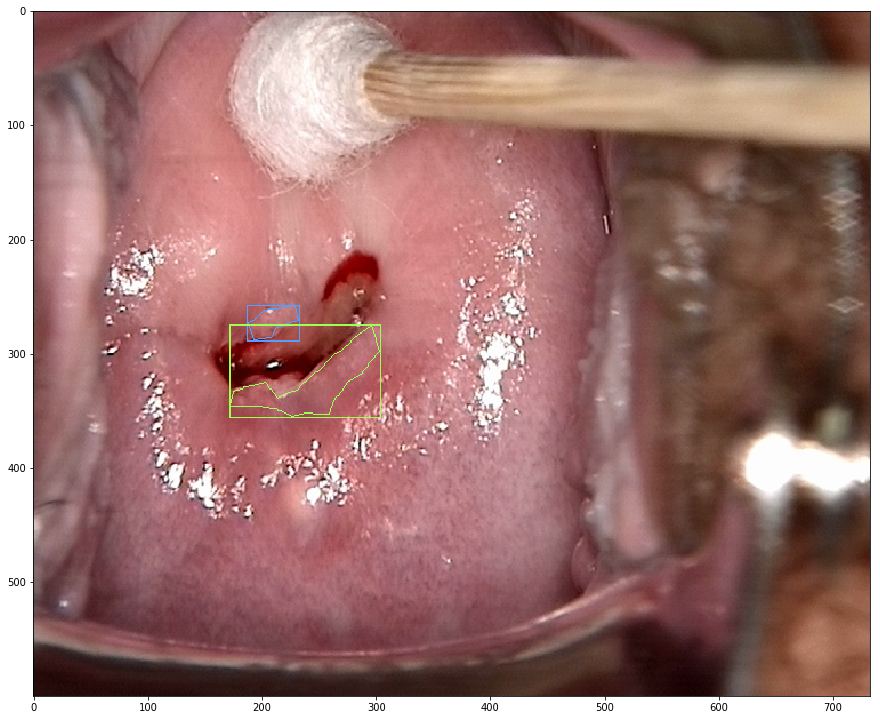

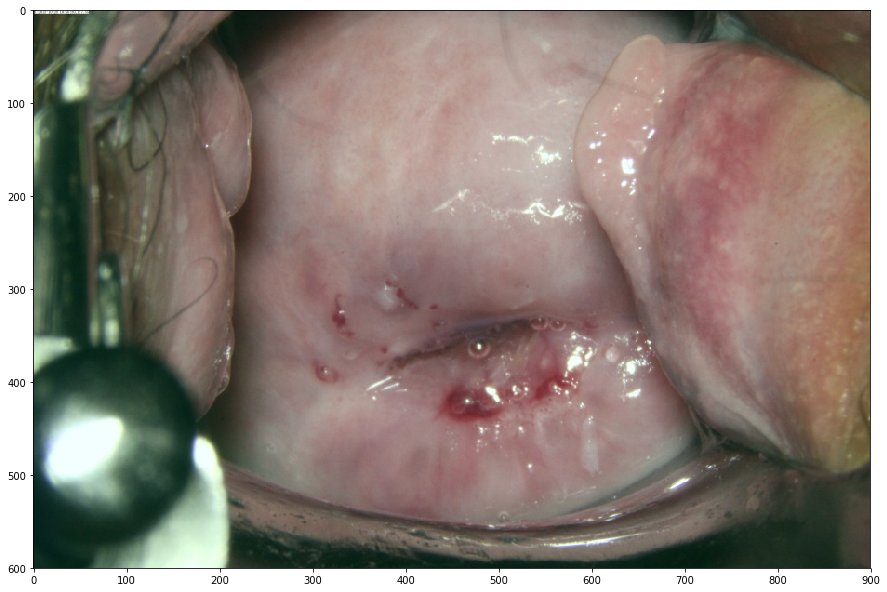

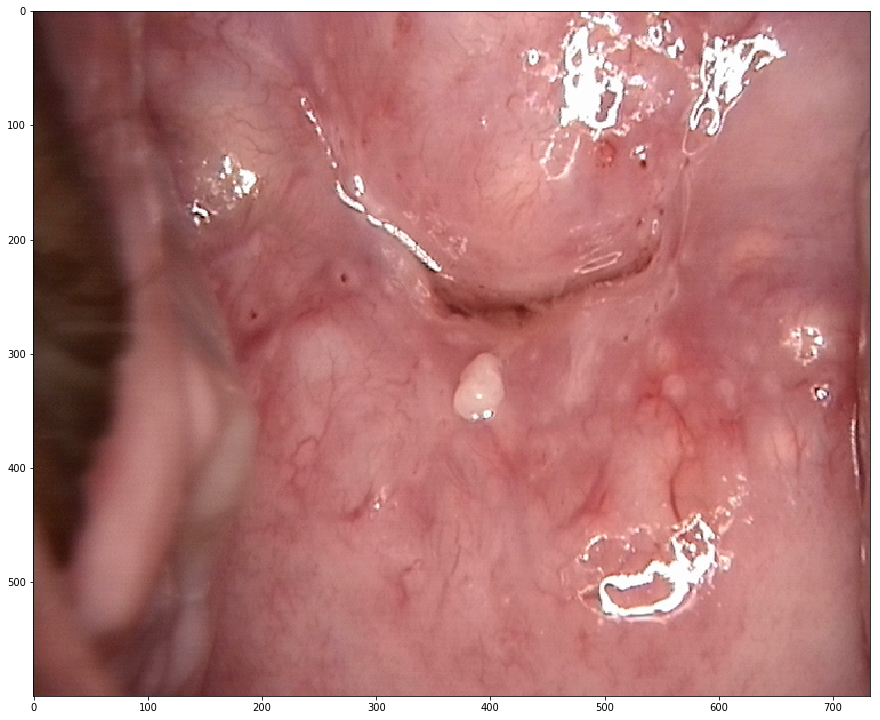

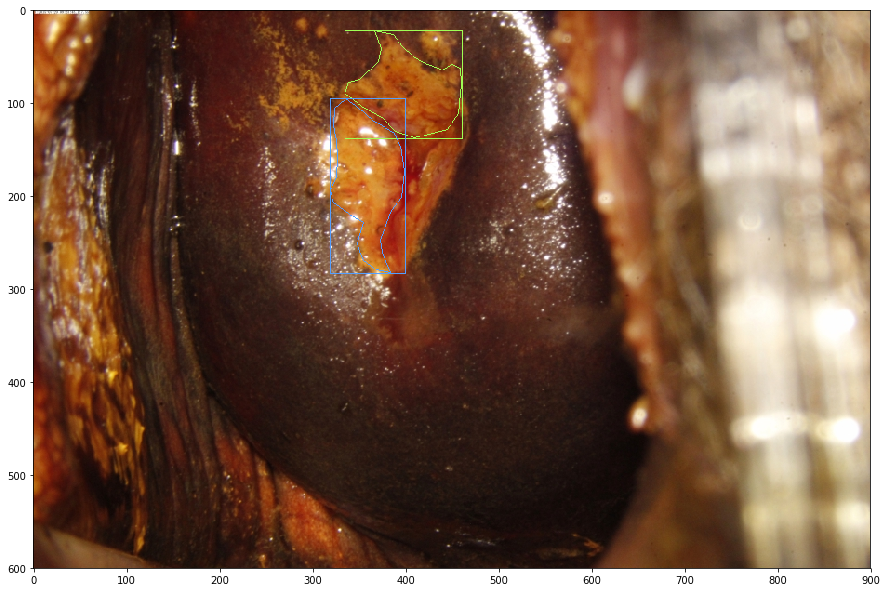

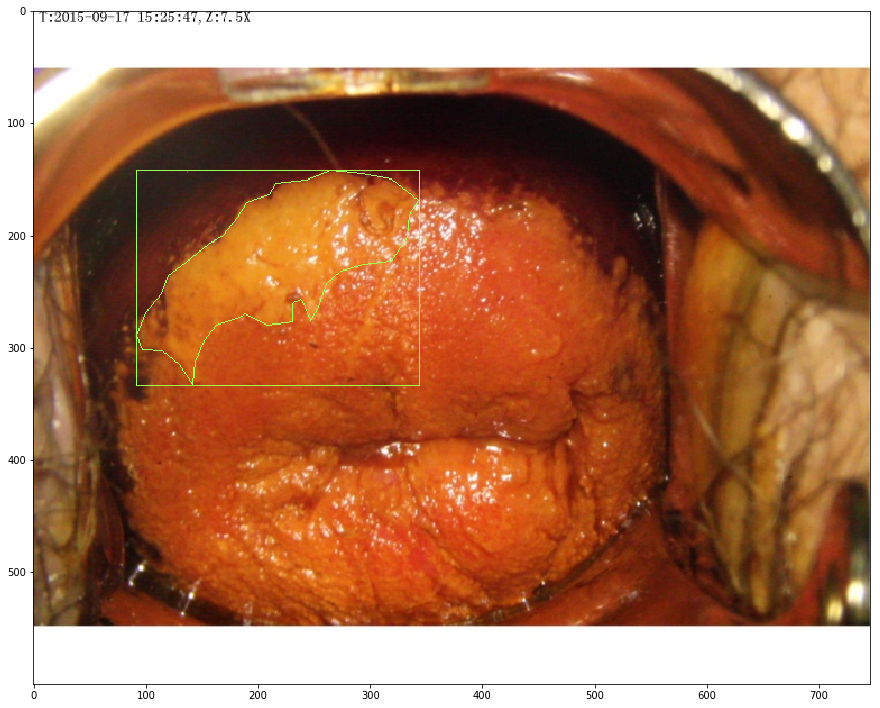

...

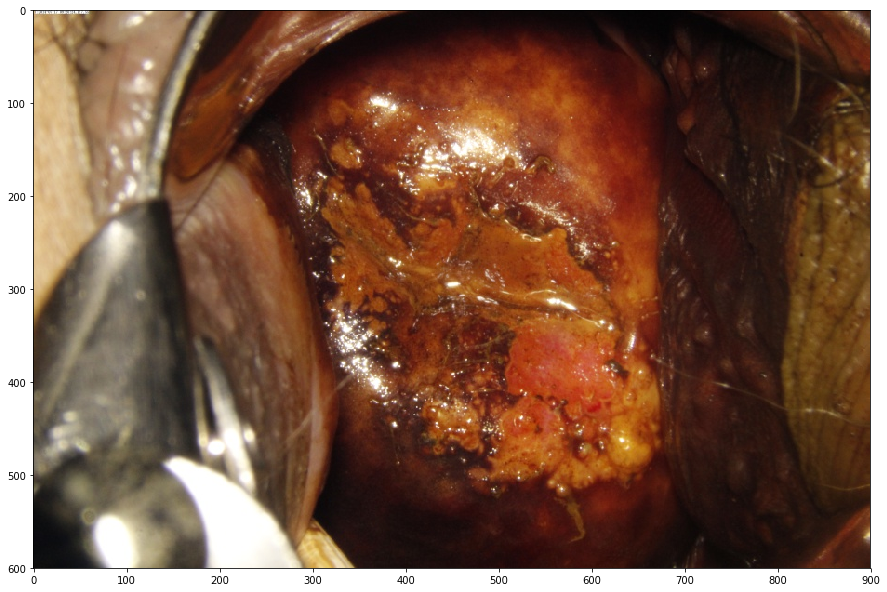

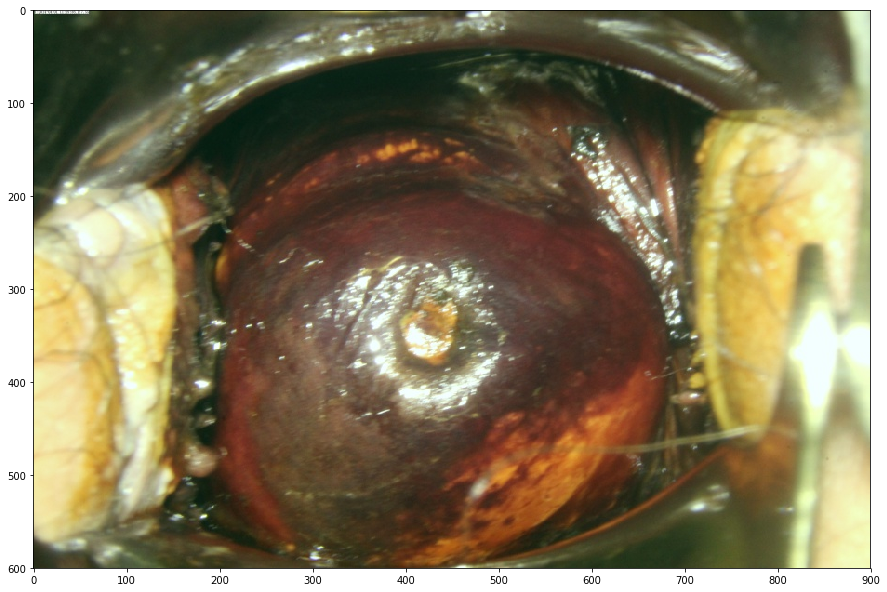

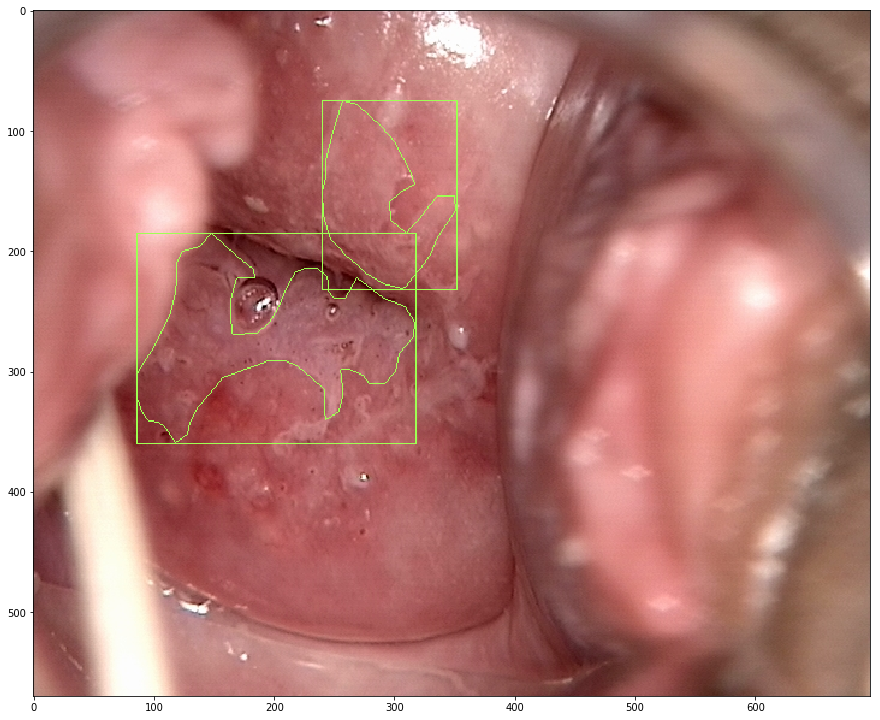

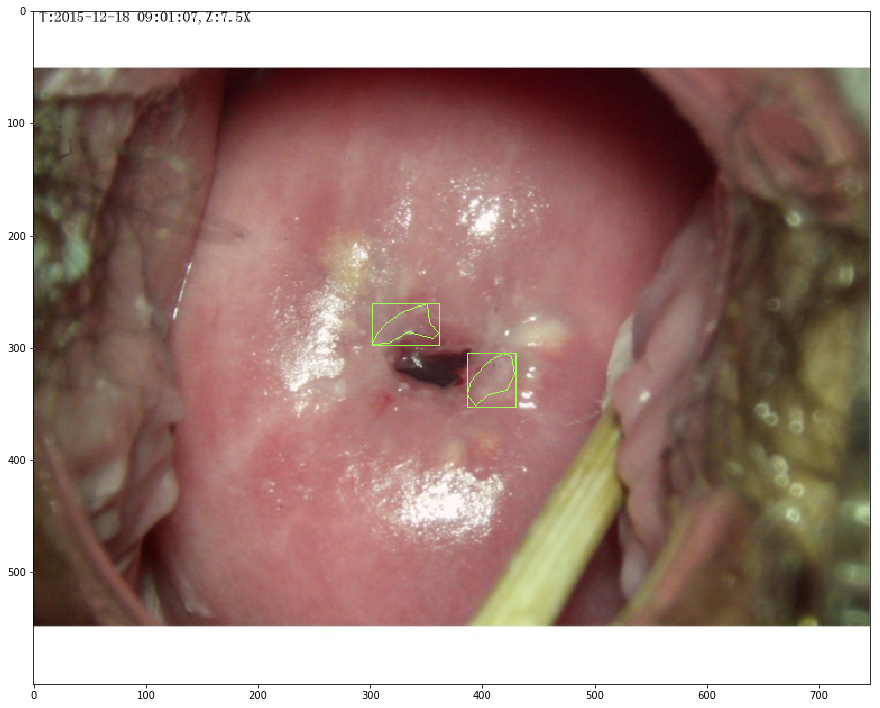

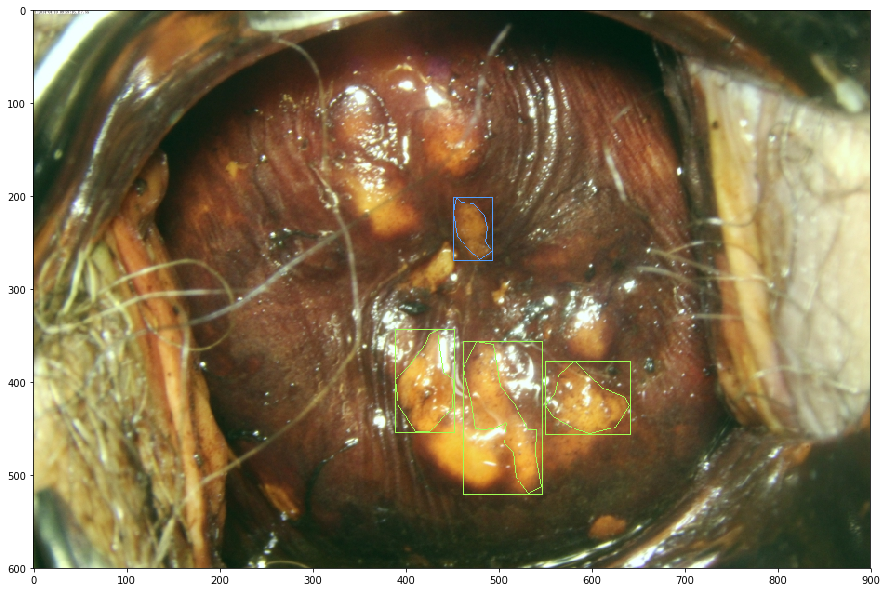

KeyboardInterrupt: 

In [21]:
import pickle as pkl
import os
import cv2
import matplotlib.pyplot as plt
import torch
import pycocotools.mask as mask_utils

anno_path = '/data/lxc/Cervix/detection/annos/anno.pkl'
image_root = '/data/mxj/Cervix/Segmentation/cervix_resize_600_segmentation/Images'
img_ext = '.jpg'
out_root = '/data/lxc/output/vis'

annos = pkl.load(open(anno_path, 'rb'))
color = [(84, 255, 159), (255, 159, 84), (200, 255, 200)]

for name, anno in annos.items():
    img_path = os.path.join(image_root, name + img_ext)
    img = cv2.imread(img_path)
    
    for box in anno['annos']:
        label = box['label']
        coor = box['box']
        cv2.rectangle(img, (coor[0], coor[1]), (coor[2], coor[3]), color[label-1], 1)
        
        rle = box['segmentation']
        mask = mask_utils.decode(rle)
        _, thresh = cv2.threshold(mask, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        contours, hierarchy = cv2.findContours(thresh, 3, 2)
        cv2.drawContours(img, contours, -1, color[label-1], 1)        
        
    img = img[:, :, [2,1,0]]
    plt.figure(1, figsize=(15, 15))
    plt.imshow(img)
    plt.show()
    img = img[:, :, [2,1,0]]
    
    out_path = os.path.join(out_root, name + img_ext)
    cv2.imwrite(out_path, img)
    

In [18]:
bug = annos['01596889_2018-06-12_3']
print(bug)
print(len(bug['annos']))

{'shape': (600, 900), 'annos': [{'box': [394, 64, 637, 416], 'segmentation': {'size': [600, 900], 'counts': b'iRW7Y1[a0g0YO5L4K5K6K4K5K5M3M3N2M3M3N3L3N2M3N2M5K7J5J8I8I7IU2kM0000000eMiHUIX7g6oHUIQ7h6VITIj6i6\\ITId6i6cISI]6j6iISIW6j6PJRIP6k6WJQIi5l6\\JRId5k6`JTIa5i6bJUI_5j6dJTI\\5l6eJSI[5l6gJSIY5m6hJRIX5m6jJRIV5n6kJQIU5n6mJQIT5n6nJPIR5o6PKPIP5P7QKoHo4P7SKoHm4P7UKoHi4S7WKmHg4T7[KkHc4W7]KiHa4X7aKgH\\4\\7dKfHX4[7jKgHQ4[7oKgHm3Z7ULhHe3\\7[LfH`3\\7`LfH\\3]7dLeHW3^7hLeHR3^7oLcHm2`7RMcHi2_7XMcHc2`7]MaH^2c7aM`HZ2b7gM_HU2d7jM]HS2f7mM[Ho1g7QNZHl1i7TNWHh1l7XNVHd1m7_NPH^1S8hNgGU1[8QOaGk0b8YOZGd0h8^OWG?j8DVG7m8KRG2o81PGLR96nFFS9=lF_OW9c0jFXOX9j0kFoNV9R1oFgNS9Y1QGaNP9`1UGXNn8h1VGRNk8o1XGlMj8T2XGhMj8X2YG`Mk8b2WGTMP9l2RGlLS9U3PGaLW9_3lFWLZ9j3hFnK^9R4e2O2M2M4L3N2M4L2N101N2N2O0O2N20O1000000O10000O1000001N10000O1000000O1001O1O1O2N100O1O1O1O2N100O1O1O1O1O2O0O1O1O0010O01O001O1O010O001O010O10O010O010O01O10O010O010O01O10O010O010O0100O1O010O100O100O00100O100O010O100O10O01000000O10O10O101O1O1N2O1O1N2O1O1O1N2O1O1